In [156]:
import pandas as pd
import numpy as np
import random as rd
import matplotlib.pyplot as plt 
from sklearn.preprocessing import LabelEncoder
import datetime
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import geopandas as gpd
from shapely.geometry import Point, Polygon
from sklearn.preprocessing import LabelEncoder
from sklearn.neighbors import BallTree
import copy
from scipy.stats import mode
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support, accuracy_score

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

In [131]:
nyc_df = pd.read_csv('../00_Raw_Data/new_york_city_crashes.csv')

/tmp/ipykernel_77754/791004906.py:1: DtypeWarning:

Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.



In [132]:
nyc_df = nyc_df.rename(columns=lambda x: x.lower().replace(' ', '_'))

In [133]:
nyc_df.sample(5)

,crash_date,crash_time,borough,zip_code,latitude,longitude,location,on_street_name,cross_street_name,off_street_name,number_of_persons_injured,number_of_persons_killed,number_of_pedestrians_injured,number_of_pedestrians_killed,number_of_cyclist_injured,number_of_cyclist_killed,number_of_motorist_injured,number_of_motorist_killed,contributing_factor_vehicle_1,contributing_factor_vehicle_2,contributing_factor_vehicle_3,contributing_factor_vehicle_4,contributing_factor_vehicle_5,collision_id,vehicle_type_code_1,vehicle_type_code_2,vehicle_type_code_3,vehicle_type_code_4,vehicle_type_code_5
1817513,01/29/2013,10:25,QUEENS,11385,40.699839,-73.908681,"(40.6998393, -73.9086812)",MYRTLE AVENUE,ST NICHOLAS AVENUE,NaN,1.0,0.0,1,0,0,0,0,0,Unspecified,NaN,NaN,NaN,NaN,215254,PASSENGER VEHICLE,NaN,NaN,NaN,NaN
354428,08/31/2019,8:32,QUEENS,11377.0,40.734560,-73.893240,"(40.73456, -73.89324)",71 STREET,CALAMUS AVENUE,NaN,0.0,0.0,0,0,0,0,0,0,Driver Inattention/Distraction,Unspecified,NaN,NaN,NaN,4198900,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN,NaN
1429722,12/13/2014,11:45,BROOKLYN,11217,40.687192,-73.974615,"(40.6871919, -73.9746155)",LAFAYETTE AVENUE,SOUTH PORTLAND AVENUE,NaN,0.0,0.0,0,0,0,0,0,0,Lost Consciousness,Unspecified,NaN,NaN,NaN,3136172,SPORT UTILITY / STATION WAGON,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN
1364775,04/08/2015,10:25,MANHATTAN,10027.0,40.808973,-73.948325,"(40.8089731, -73.9483252)",WEST 125 STREET,7 AVENUE,NaN,0.0,0.0,0,0,0,0,0,0,Failure to Yield Right-of-Way,Unspecified,NaN,NaN,NaN,3199352,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
1852502,11/12/2012,15:51,MANHATTAN,10019,40.768033,-73.995848,"(40.7680332, -73.9958483)",WEST SIDE HIGHWAY,WEST 52 STREET,NaN,0.0,0.0,0,0,0,0,0,0,Failure to Yield Right-of-Way,Driver Inattention/Distraction,NaN,NaN,NaN,39230,VAN,PASSENGER VEHICLE,NaN,NaN,NaN


In [134]:
def unique_values_count(df: pd.DataFrame, column: str) -> pd.DataFrame:
    """Return unique values, their counts, and the count of missing values for a given DataFrame column."""
    
    counts = df[column].value_counts(dropna=False).reset_index()
    counts.columns = [column, 'Count']
    
    counts[column] = counts[column].fillna('Missing')
    
    return counts

In [135]:
nyc_df = nyc_df.dropna(subset=['latitude', 'longitude'])

In [136]:
nyc_df['crash_date'] = pd.to_datetime(nyc_df['crash_date'], format='%m/%d/%Y')
nyc_df['date'] = nyc_df['crash_date'].dt.date

In [137]:
nyc_df['day_of_week'] = nyc_df['crash_date'].dt.dayofweek # 0: Monday - 6: Sunday
nyc_df['month'] = nyc_df['crash_date'].dt.month
nyc_df['year'] = nyc_df['crash_date'].dt.year

In [138]:
nyc_df['crash_time'] = pd.to_datetime(nyc_df['crash_time'], format='%H:%M').dt.time
nyc_df['hour'] = nyc_df['crash_time'].apply(lambda x: x.hour)

In [139]:
# accidents_per_hour = nyc_df.groupby('hour').size().reset_index(name='accident_count')

# fig = px.bar(accidents_per_hour, 
#              x='hour', 
#              y='accident_count', 
#              title='Number of Accidents per Hour', 
#              labels={'hour': 'Hour of the Day', 'accident_count': 'Number of Accidents'})
# fig.show()

In [140]:
fig = make_subplots(rows=7, cols=1, subplot_titles=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

for day in range(7):
    filtered_df = nyc_df[nyc_df['day_of_week'] == day]
    hour_counts = filtered_df['hour'].value_counts().sort_index()
    fig.add_trace(
        go.Bar(x=hour_counts.index, y=hour_counts.values, name=f'Day {day}'),
        row=day + 1, col=1
    )
fig.update_layout(height=1400, width=600, title_text="Accidents by Hour for Each Day of the Week")
fig.show()


In [141]:
def categorize_time_window(hour):
    if 6 <= hour <= 9:
        return 'rush_morning'
    elif 14 <= hour <= 18:
        return 'rush_evening'
    elif 10 <= hour <= 14:
        return 'non_rush_day'
    else:  
        return 'non_rush_night'

nyc_df['time_window'] = nyc_df['hour'].apply(categorize_time_window)

In [142]:
time_window_counts = nyc_df['time_window'].value_counts()
total = time_window_counts.sum()
time_window_percentages = (time_window_counts / total) * 100

fig = px.bar(time_window_counts, x=time_window_counts.index, y=time_window_counts.values,
             labels={'y': 'Count', 'x': 'Time Window'},
             text=[f"{pct:.2f}%" for pct in time_window_percentages.values])

# Update hover data to show both count and percentage
fig.update_traces(hovertemplate='%{x}: %{y} rows<br>%{text}')

# Update layout and titles
fig.update_layout(title_text='Count and Percentage for Each Time Window in Weekday Data')
fig.show()

In [144]:
def plot_accidents_on_map(df, start_date, end_date, day_of_week=None, roadway_name=None):
    df = df.copy()
    time_window_colors = {
        'rush_morning': '#17BECF',
        'rush_evening': '#FE00FA',
        'non_rush_day': '#FB0D0D',
        'non_rush_night': '#6C7C32'
    }

    df['crash_date'] = pd.to_datetime(df['crash_date'])
    if end_date < start_date:
        start_date, end_date = end_date, start_date
    if day_of_week and 'all' not in day_of_week:
        df = df[df['day_of_week'].isin(day_of_week)]

    filtered_df = df.copy()
    filtered_df = filtered_df[(filtered_df['crash_date'] >= start_date) & (filtered_df['crash_date'] <= end_date)]

    if roadway_name:
        filtered_df = filtered_df[filtered_df['on_street_name'] == roadway_name]

    center_lat = 40.75
    center_lon = -73.98  
    if roadway_name and not filtered_df.empty:
        center_lat = filtered_df['latitude'].median()
        center_lon = filtered_df['longitude'].median()

    zoom_level = 13

    traces = []
    for time_window, color in time_window_colors.items():
        subset = filtered_df[filtered_df['time_window'] == time_window]

        if not subset.empty:
            trace = go.Scattermapbox(
                lon=subset['longitude'],
                lat=subset['latitude'],
                mode='markers',
                marker=dict(color=color, size=7),
                name=time_window,
                hovertext=subset['on_street_name'] + "<br>" + subset['hour'].astype(str) + "H",
                legendgroup=time_window
            )
        else:
            trace = go.Scattermapbox(
                lon=[None],
                lat=[None],
                mode='markers',
                marker=dict(color=color, size=7),
                name=time_window,
                showlegend=True,
                legendgroup=time_window
            )
        traces.append(trace)

    layout = go.Layout(
        mapbox=dict(
            center=dict(lat=center_lat, lon=center_lon),
            zoom=zoom_level,
            style="open-street-map"
        ),
        title='Scatter Map of Accidents',
        margin={"r": 0, "t": 50, "l": 0, "b": 10}
    )

    fig = go.Figure(data=traces, layout=layout)
    return fig


In [145]:
latest_datetime = nyc_df['crash_date'].max()
latest_date = latest_datetime.to_pydatetime()
earliest_datetime = nyc_df['crash_date'].min()
earliest_date = earliest_datetime.to_pydatetime()
nyc_df_sampled = nyc_df.sample(n=100000, random_state=42)
plot_accidents_on_map(nyc_df_sampled, earliest_date, latest_date)

In [146]:
nyc_df['number_of_persons_killed'].fillna(0, inplace=True)
nyc_df['number_of_persons_injured'].fillna(0, inplace=True)

nyc_df['borough'].fillna('MISSING', inplace=True)
nyc_df['on_street_name'].fillna('MISSING', inplace=True)
nyc_df['contributing_factor_vehicle_1'].fillna('Unspecified', inplace=True)
mapping = {
    'contributing_factor_vehicle_1': {
        'Unspecified': 'Unspecified',
        'Missing': 'Unspecified',
        '1': 'Unspecified',
        'Illness': 'Illness',
        'Illnes': 'Illness',
        'Drugs (illegal)': 'Illegal Drugs',
        'Drugs (Illegal)': 'Illegal Drugs'
    }
}
nyc_df.replace(mapping, inplace=True)


borough_encoder = LabelEncoder()
on_street_name_encoder = LabelEncoder()
contributing_factor_encoder = LabelEncoder()

# Label encode the columns
nyc_df['borough'] = borough_encoder.fit_transform(nyc_df['borough'])
nyc_df['on_street_name'] = on_street_name_encoder.fit_transform(nyc_df['on_street_name'])
nyc_df['contributing_factor_vehicle_1'] = contributing_factor_encoder.fit_transform(nyc_df['contributing_factor_vehicle_1'])

In [147]:
selected_columns = [
    'collision_id','day_of_week', 'month', 'year', 'latitude', 'longitude',
    'number_of_persons_injured', 'number_of_persons_killed',
    'borough', 'on_street_name', 'contributing_factor_vehicle_1',
    'time_window'
]
nyc_final = nyc_df[selected_columns].copy()

In [148]:
nyc_final['number_of_persons_injured'] = nyc_final['number_of_persons_injured'].astype(int)
nyc_final['number_of_persons_killed'] = nyc_final['number_of_persons_killed'].astype(int)

In [149]:
time_window_mapping = {
    'rush_morning': 0,
    'rush_evening': 1,
    'non_rush_day': 2,
    'non_rush_night': 3
}

nyc_final['time_window'] = nyc_final['time_window'].replace(time_window_mapping)

In [150]:
nyc_final = nyc_final.sample(frac=1, random_state=42).reset_index(drop=True)

In [151]:
train_val, test = train_test_split(nyc_final, test_size=0.1, stratify=nyc_final['time_window'], random_state=42)
train, val = train_test_split(train_val, test_size=2/9, stratify=train_val['time_window'], random_state=42) 

In [152]:
tree = BallTree(train[['latitude', 'longitude']].values)

def calculate_mode_time_window_of_nearest(train_tree, train_data, point, k=4):
    dist, ind = train_tree.query(point, k=k)
    time_windows = train_data.iloc[ind[0]]['time_window']

    if len(time_windows) < k: 
        return np.nan

    mode_result = mode(time_windows)
    modes = mode_result.mode

    if modes.size == 0:  # No mode found
        return np.nan
    elif modes.size > 1:  # Handle ties by selecting a random mode
        return random.choice(modes)
    else:
        return modes.item()
nyc_final['most_common_time_window_4_neigh'] = nyc_final.apply(
    lambda row: calculate_mode_time_window_of_nearest(
        tree, 
        train[['time_window']],  
        np.array([[row['latitude'], row['longitude']]]),
    ), 
    axis=1
)
# Make sure 'master_record_number' is set as the index for the merge operation if it's not already the index
nyc_final = nyc_final.set_index('collision_id')[['most_common_time_window_4_neigh']]

# Merge 'avg_hour_4_neigh' into the original train, validation, and test sets using 'master_record_number'
train_with_avg_hour = train.set_index('collision_id').join(nyc_final)
val_with_avg_hour = val.set_index('collision_id').join(nyc_final)
test_with_avg_hour = test.set_index('collision_id').join(nyc_final)

# Reset the index if required to bring 'master_record_number' back to columns
train_with_avg_hour = train_with_avg_hour.reset_index()
val_with_avg_hour = val_with_avg_hour.reset_index()
test_with_avg_hour = test_with_avg_hour.reset_index()

train_mlp = train_with_avg_hour.drop(['collision_id'], axis=1).copy()
val_mlp = val_with_avg_hour.drop(['collision_id'], axis=1).copy()
test_mlp = test_with_avg_hour.drop(['collision_id'], axis=1).copy()

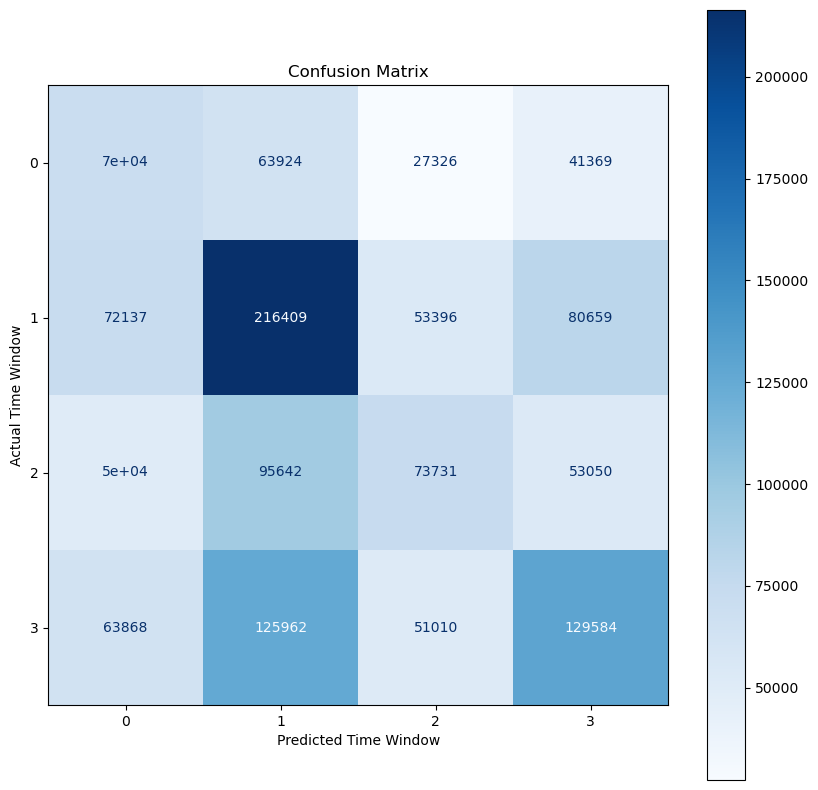

In [153]:
cm = confusion_matrix(train_mlp['time_window'], train_mlp['most_common_time_window_4_neigh'])

cmd = ConfusionMatrixDisplay(cm, display_labels=np.unique(train_mlp['time_window']))

fig, ax = plt.subplots(figsize=(10, 10))
cmd.plot(ax=ax, cmap=plt.cm.Blues)
ax.set_title('Confusion Matrix')
plt.xlabel('Predicted Time Window')
plt.ylabel('Actual Time Window')
plt.savefig('cm_nyc_4_nearest_neighbors_time_window_train12.png')

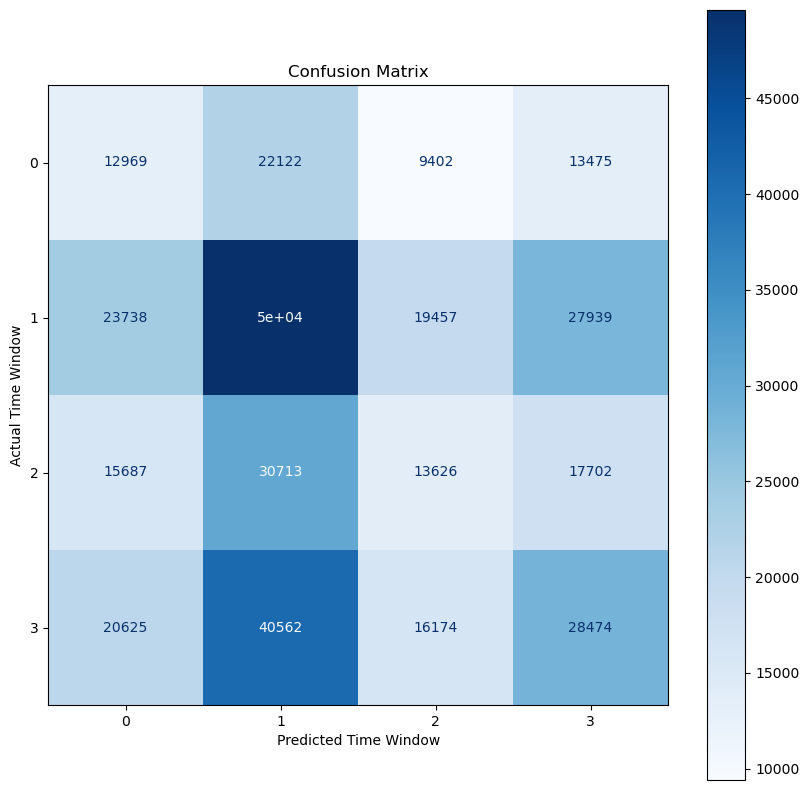

In [154]:
cm = confusion_matrix(val_mlp['time_window'], val_mlp['most_common_time_window_4_neigh'])

cmd = ConfusionMatrixDisplay(cm, display_labels=np.unique(val_mlp['time_window']))

fig, ax = plt.subplots(figsize=(10, 10))
cmd.plot(ax=ax, cmap=plt.cm.Blues)
ax.set_title('Confusion Matrix')
plt.xlabel('Predicted Time Window')
plt.ylabel('Actual Time Window')
plt.savefig('cm_nyc_4_nearest_neighbors_time_window_val12.png')

In [158]:
y_true = val_mlp['time_window']
y_pred = val_mlp['most_common_time_window_4_neigh']

precision, recall, f1_score, _ = precision_recall_fscore_support(y_true, y_pred, average=None)
class_names = np.unique(y_true)

print("Class-wise Metrics:")
for i, class_name in enumerate(class_names):
    print(f"{class_name} - Precision: {precision[i]:.2f}, Recall: {recall[i]:.2f}, F1-Score: {f1_score[i]:.2f}")

# Calculate macro and micro averages
precision_macro, recall_macro, f1_score_macro, _ = precision_recall_fscore_support(y_true, y_pred, average='macro')
precision_micro, recall_micro, f1_score_micro, _ = precision_recall_fscore_support(y_true, y_pred, average='micro')

print("\nMacro Averages:")
print(f"Precision: {precision_macro:.2f}, Recall: {recall_macro:.2f}, F1-Score: {f1_score_macro:.2f}")

print("\nMicro Averages:")
print(f"Precision: {precision_micro:.2f}, Recall: {recall_micro:.2f}, F1-Score: {f1_score_micro:.2f}")

# Finally, print out the accuracy as well
accuracy = accuracy_score(y_true, y_pred)
print(f"\nAccuracy: {accuracy:.2f}")

Class-wise Metrics:
0 - Precision: 0.18, Recall: 0.22, F1-Score: 0.20
1 - Precision: 0.35, Recall: 0.41, F1-Score: 0.38
2 - Precision: 0.23, Recall: 0.18, F1-Score: 0.20
3 - Precision: 0.33, Recall: 0.27, F1-Score: 0.29

Macro Averages:
Precision: 0.27, Recall: 0.27, F1-Score: 0.27

Micro Averages:
Precision: 0.29, Recall: 0.29, F1-Score: 0.29

Accuracy: 0.29


In [159]:
train_mlp.sample(4)

,day_of_week,month,year,latitude,longitude,number_of_persons_injured,number_of_persons_killed,borough,on_street_name,contributing_factor_vehicle_1,time_window,most_common_time_window_4_neigh
1039069,1,3,2023,40.712500,-73.895530,0,0,4,8051,52,0,0
1219814,1,2,2016,40.868014,-73.872343,0,0,3,8051,53,3,1
413879,1,6,2016,40.755066,-73.820990,1,0,4,3431,18,2,2
309554,1,12,2012,40.632886,-73.947698,0,0,1,5497,53,3,0


In [160]:
train_mlp.to_csv("../03_Data_for_Modeling/train_mlp_nyc_crashes.csv", index=False)
val_mlp.to_csv("../03_Data_for_Modeling/val_mlp_nyc_crashes.csv", index=False)
test_mlp.to_csv("../03_Data_for_Modeling/test_mlp_nyc_crashes.csv", index=False)